In [93]:
from univread import read as imread
import numpy as np
import tifffile

In [52]:
from matplotlib import pyplot as plt
%matplotlib inline

In [59]:
%%time
proj_ff = imread('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/iteration_06keV/ff') 

CPU times: user 2.35 s, sys: 6.74 s, total: 9.09 s
Wall time: 57.4 s


In [68]:
from glob import glob
import os

In [79]:
from tqdm.auto import tqdm

In [76]:
energy_folders = sorted(glob('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/iteration_*keV/ff'))
proj_names = [os.path.split(i)[-1] for i in sorted(glob('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/iteration_06keV/ff/*'))]

In [72]:
mkdir /mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/spectral_projections

In [94]:
for proj_name in tqdm(proj_names):
    one_proj = []

    for energy_folder in energy_folders:
        one_proj.append(imread(os.path.join(energy_folder, proj_name)))
    one_proj = np.stack(one_proj)
    tifffile.imsave(os.path.join('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/spectral_projections', proj_name), one_proj)

  0%|          | 0/1023 [00:00<?, ?it/s]

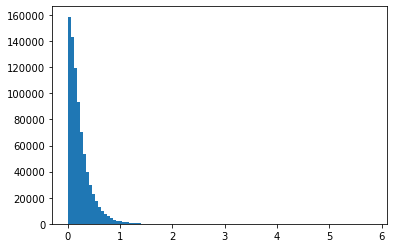

In [100]:
plt.hist(np.abs(one_proj[0] - one_proj[1]).flatten(), bins=100);

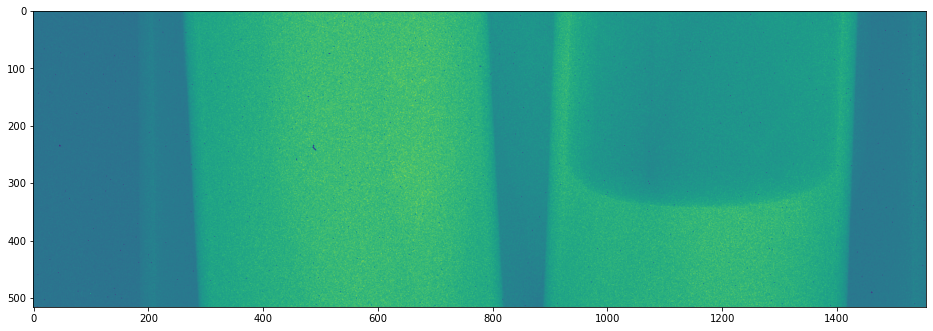

In [81]:
plt.figure(figsize=(16, 10))
plt.imshow(one_proj[0])

In [105]:
from skimage.metrics import peak_signal_noise_ratio

In [139]:
a = tifffile.imread('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/iteration_30keV/ff/proj_0300.tif')

In [140]:
b = tifffile.imread('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_04/iteration_30keV/ff/proj_0300.tif')

In [141]:
peak_signal_noise_ratio(b, a, data_range=b.max()-b.min())

17.690171426293432

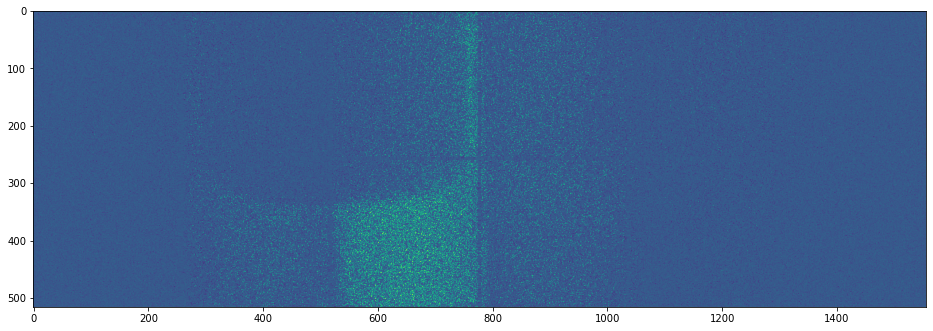

In [142]:
plt.figure(figsize=(16, 10))
plt.imshow(b - a)

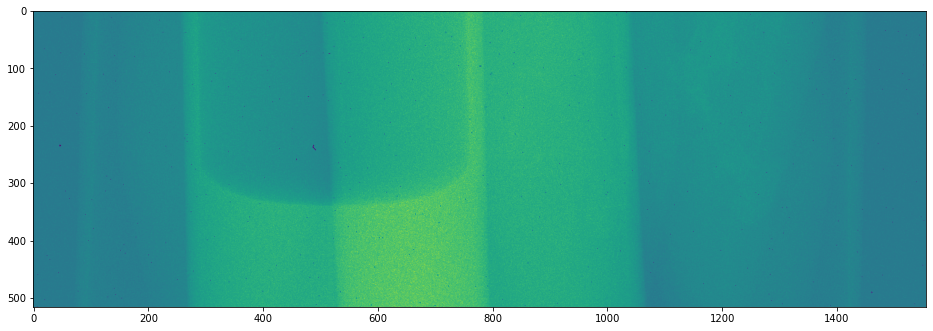

In [143]:
plt.figure(figsize=(16, 10))
plt.imshow(b)

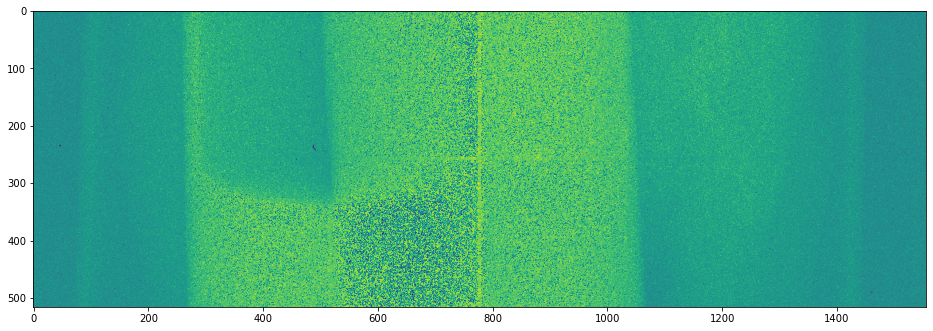

In [144]:
plt.figure(figsize=(16, 10))
plt.imshow(a)

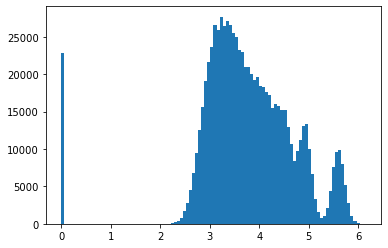

In [145]:
plt.hist(a.flatten(), bins=100);

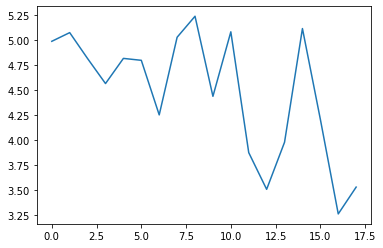

In [92]:
plt.plot(one_proj[:, 400, 400])

In [75]:
ls /autofs/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/iteration_06keV/

ff/  recon/


In [53]:
%%time
proj_raw = imread('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct/spec_ct_03/iteration_10keV/radios/') 

CPU times: user 2.44 s, sys: 9.36 s, total: 11.8 s
Wall time: 48.1 s


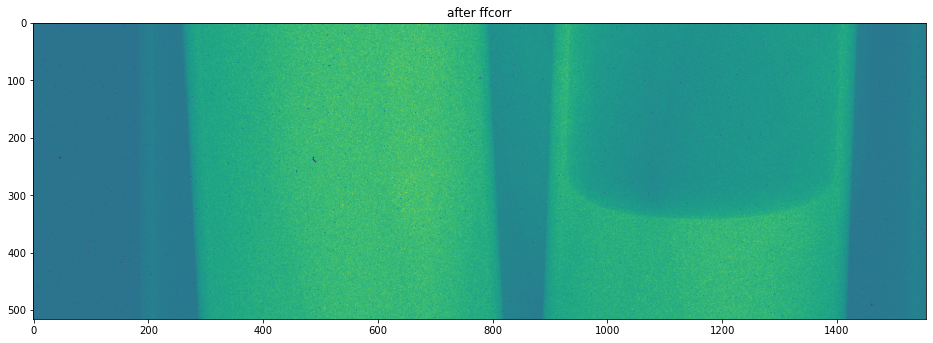

In [60]:
plt.figure(figsize=(16, 10))
plt.imshow(proj_ff[1])
plt.title('after ffcorr')
plt.show()

Text(0.5, 1.0, 'before ffcorr')

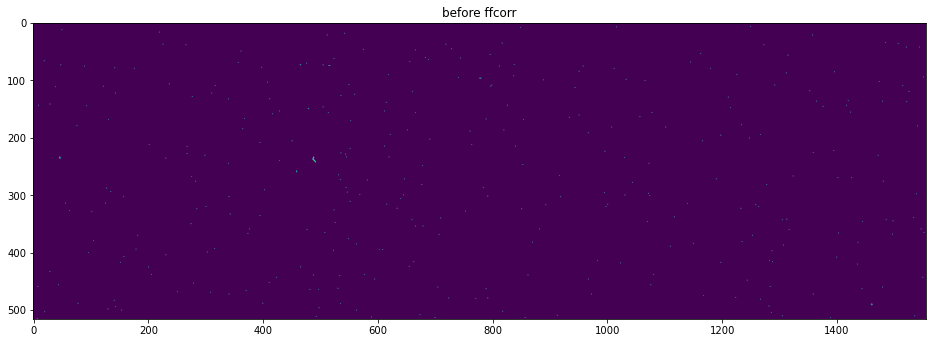

In [50]:
plt.figure(figsize=(16, 10))
plt.imshow(proj_raw[1] == 0)
plt.title('before ffcorr')

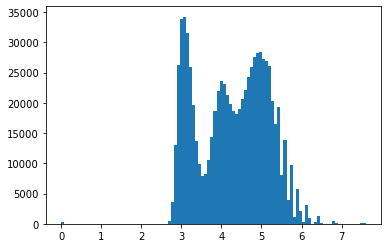

In [57]:
plt.hist(proj_ff[1].flatten(), bins=100);

In [11]:
proj_series[1]

array([[183, 172, 148, ..., 141, 119, 140],
       [180, 187, 159, ..., 124,  98, 129],
       [154, 147, 145, ...,  95,  92, 135],
       ...,
       [149, 139, 133, ...,  96, 128, 108],
       [147, 140, 158, ..., 104, 109, 137],
       [180, 157, 159, ..., 115, 131, 143]], dtype=int32)

In [207]:
a = tifffile.imread('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/spectral_projections/proj_0350.tif')

In [208]:
b = tifffile.imread('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/spectral_projections_processed/proj_0350.tif')

In [209]:
b = np.concatenate([b[[0]], b, b[[-1]]])

In [213]:
energy_lvl = 3

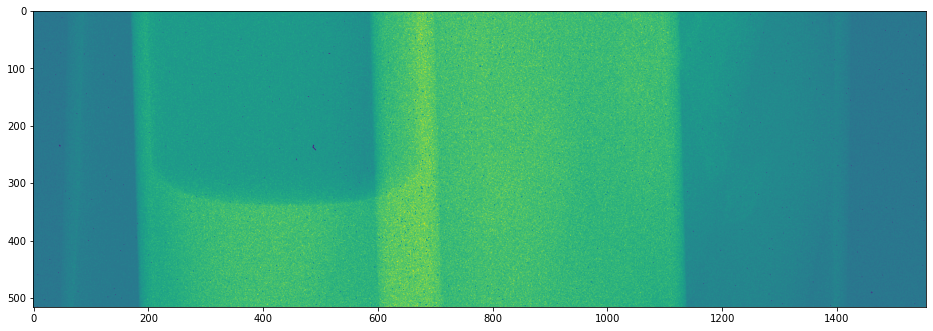

In [214]:
plt.figure(figsize=(16, 10))
plt.imshow(a[energy_lvl])

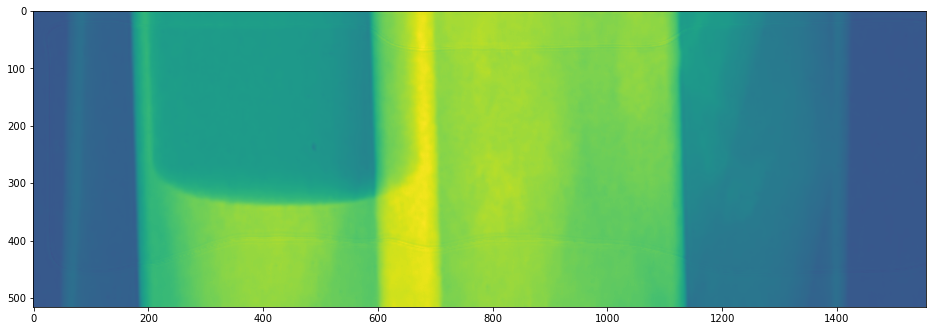

In [215]:
plt.figure(figsize=(16, 10))
plt.imshow(b[energy_lvl])

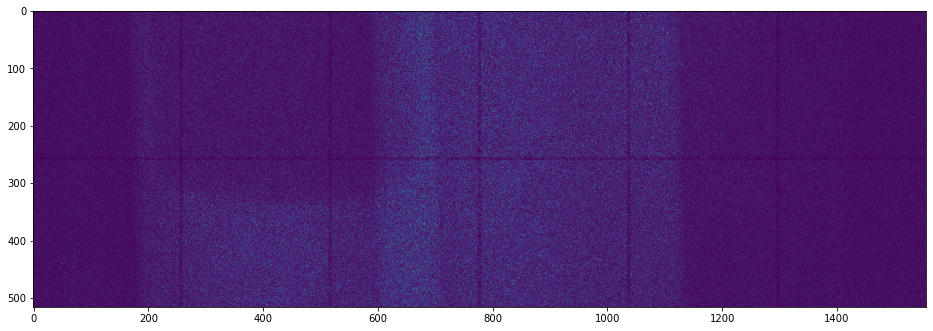

In [222]:
plt.figure(figsize=(16, 10))
aux = np.abs(a[energy_lvl] - b[energy_lvl])
aux[a[energy_lvl] == 0] = 0
plt.imshow(aux)

In [174]:
import re

In [176]:
c = tifffile.imread(os.path.join(re.sub('processed_03', 'processed_04', energy_folders[energy_lvl]), 'proj_0302.tif'))

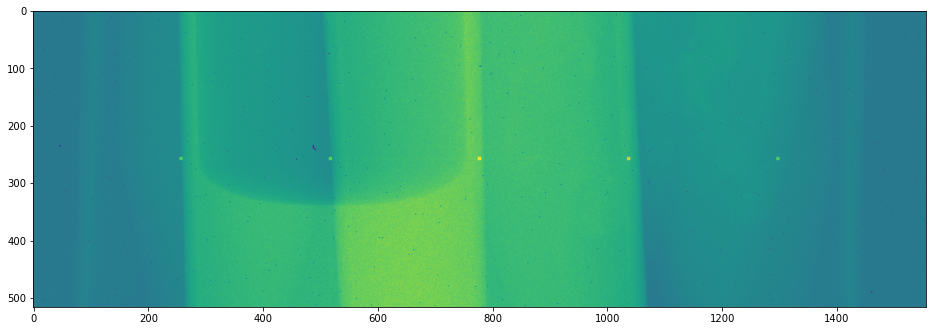

In [177]:
plt.figure(figsize=(16, 10))
plt.imshow(c)

In [195]:
psnr_before = []
psnr_after = []

for energy_lvl in range(len(b)):
    c = tifffile.imread(os.path.join(re.sub('processed_03', 'processed_04', energy_folders[energy_lvl]), 'proj_0302.tif'))
    psnr_before.append(peak_signal_noise_ratio(c, a[energy_lvl], data_range=c.max()-c.min()))
    psnr_after.append(peak_signal_noise_ratio(c, b[energy_lvl], data_range=c.max()-c.min()))

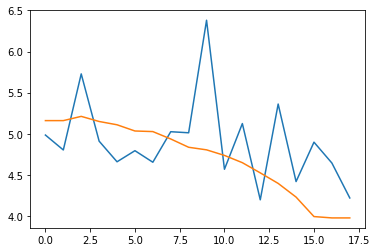

In [196]:
plt.plot(a[:, 400, 400])
plt.plot(b[:, 400, 400])

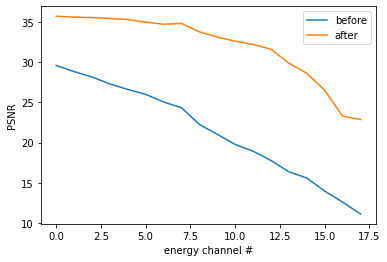

In [197]:
plt.plot(psnr_before, label='before')
plt.plot(psnr_after, label='after')
plt.legend()
plt.xlabel('energy channel #')
plt.ylabel('PSNR')
plt.show()

In [ ]:
for i in range

In [236]:
#%%
from cil.framework import AcquisitionGeometry, AcquisitionData, ImageData, ImageGeometry
from cil.plugins.astra import FBP

import numpy as np
import matplotlib.pyplot as plt
import os

from os import listdir
from os.path import isdir, join

from skimage import io

#%%
# set up geometry
n_proj = 1023
n_rows = 516
n_cols = 1556

def get_one_reco(proj, center_z=100):
    # geometrical parameters
    src_to_det = 20272+6272
    src_to_object = 6272

    mag = src_to_det / src_to_object 

    source_pos_y = -src_to_object * mag
    detector_pos_y = (src_to_det - src_to_object) * mag
    angles_list = np.linspace(0, 360, n_proj, endpoint=False)
    num_pixels_x = n_cols
    num_pixels_y = n_rows
    pixel_size_xy = 1 * mag
    centre_of_rotation = -(n_cols / 2 - 786.5)
    object_offset_x = centre_of_rotation
    detector_pos_z = (- n_rows // 2 + 256) * mag

    ag = AcquisitionGeometry.create_Cone3D(source_position=[0.0, source_pos_y, 0.0], \
                                            detector_position=[0.0, detector_pos_y, detector_pos_z],\
                                            rotation_axis_position=[object_offset_x, 0.0, 0.0]) \
                            .set_angles(angles=angles_list, angle_unit='degree')\
                            .set_panel( num_pixels=[num_pixels_x, num_pixels_y], \
                                        pixel_size=pixel_size_xy,\
                                        origin='top-left')\
                            .set_labels(['angle','vertical','horizontal'])

    ad = ag.allocate(None)
    ad.array = proj

    ad.reorder('astra')

    # ag = ad.geometry
    # ig = ag.get_ImageGeometry()
    ag = ad.geometry
    ig = ag.get_ImageGeometry()
    ig.voxel_num_z = 1
    ig.center_z = center_z 
    # слайсы считаются от центра, то есть ig.center_z = 100 соответствует n_rows // 2 - 100

    #set-up FBP recon
    fbp = FBP(ig, ag)
    fbp.set_input(ad)
    return np.squeeze(fbp.get_output().as_array())

In [224]:
template_after = '/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/spectral_projections_processed/*.tif'
template_before = '/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_03/spectral_projections/*.tif'
template_ground_truth = 'spectral_projections/*.tif'

In [264]:
%%time
channel_id = 3

projs_after = []
for img_addr in tqdm(sorted(glob(template_after))):
    projs_after.append(tifffile.memmap(img_addr)[channel_id])
projs_after = np.stack(projs_after)

  0%|          | 0/1023 [00:00<?, ?it/s]

CPU times: user 4.76 s, sys: 7.06 s, total: 11.8 s
Wall time: 2min 13s


In [265]:
%%time
reco_after = get_one_reco(projs_after)

CPU times: user 1.87 s, sys: 3.22 s, total: 5.09 s
Wall time: 5.08 s


In [266]:
%%time

projs_before = []
for img_addr in tqdm(sorted(glob(template_before))):
    projs_before.append(tifffile.memmap(img_addr)[channel_id])
projs_before = np.stack(projs_before)

  0%|          | 0/1023 [00:00<?, ?it/s]

CPU times: user 4.48 s, sys: 7.45 s, total: 11.9 s
Wall time: 2min 1s


In [267]:
%%time
reco_before = get_one_reco(projs_before)

CPU times: user 2.05 s, sys: 2.9 s, total: 4.95 s
Wall time: 4.93 s


In [268]:
%%time

projs_gt = []
gt_addrs_list = sorted(glob(sorted(glob('/mnt/HD-LSDF/sd18a004/for_yaroslav/spec_ct_processed/processed_04/*/'))[channel_id] +'ff/*.tif'))
for img_addr in tqdm(gt_addrs_list):
    projs_gt.append(tifffile.imread(img_addr))
projs_gt = np.stack(projs_gt)

  0%|          | 0/1023 [00:00<?, ?it/s]

CPU times: user 3.58 s, sys: 6.63 s, total: 10.2 s
Wall time: 53.3 s


In [269]:
%%time
reco_gt = get_one_reco(projs_gt)

CPU times: user 1.63 s, sys: 3.31 s, total: 4.94 s
Wall time: 4.93 s


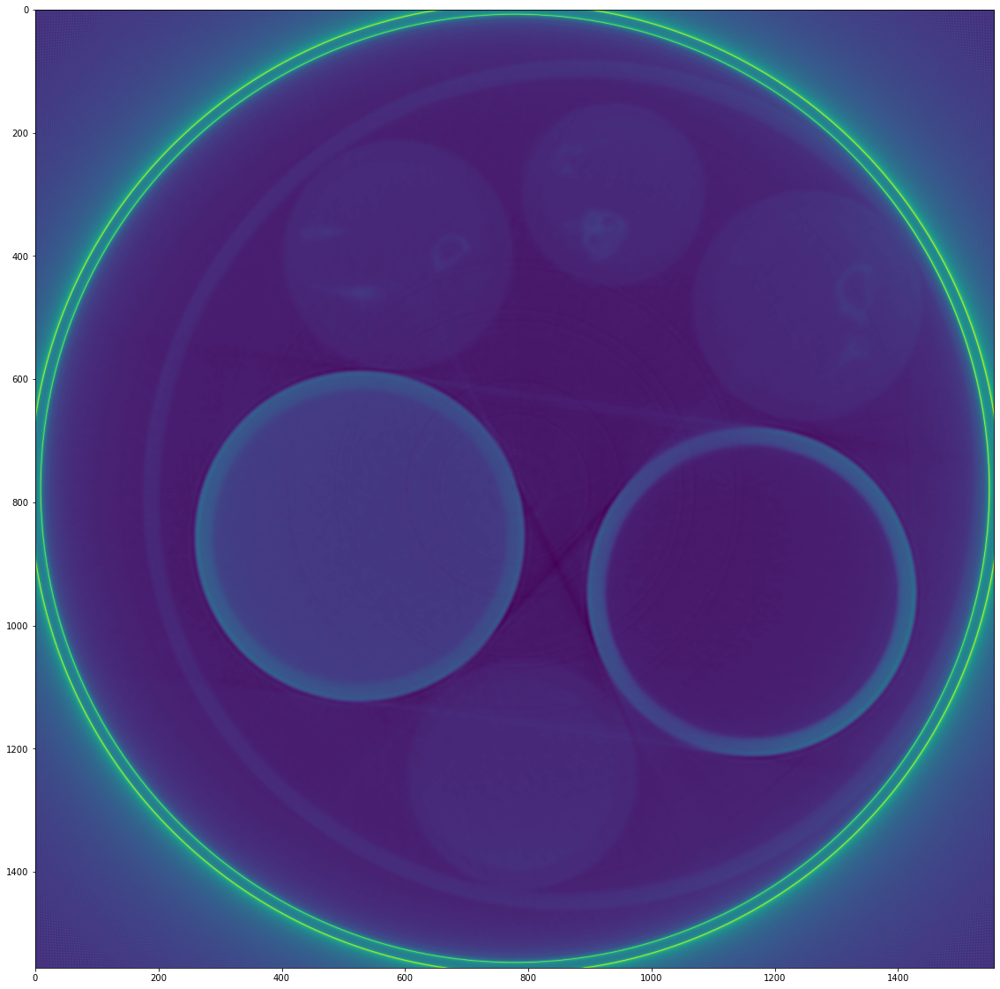

In [270]:
plt.figure(figsize=(20, 20))
plt.imshow(reco_after)

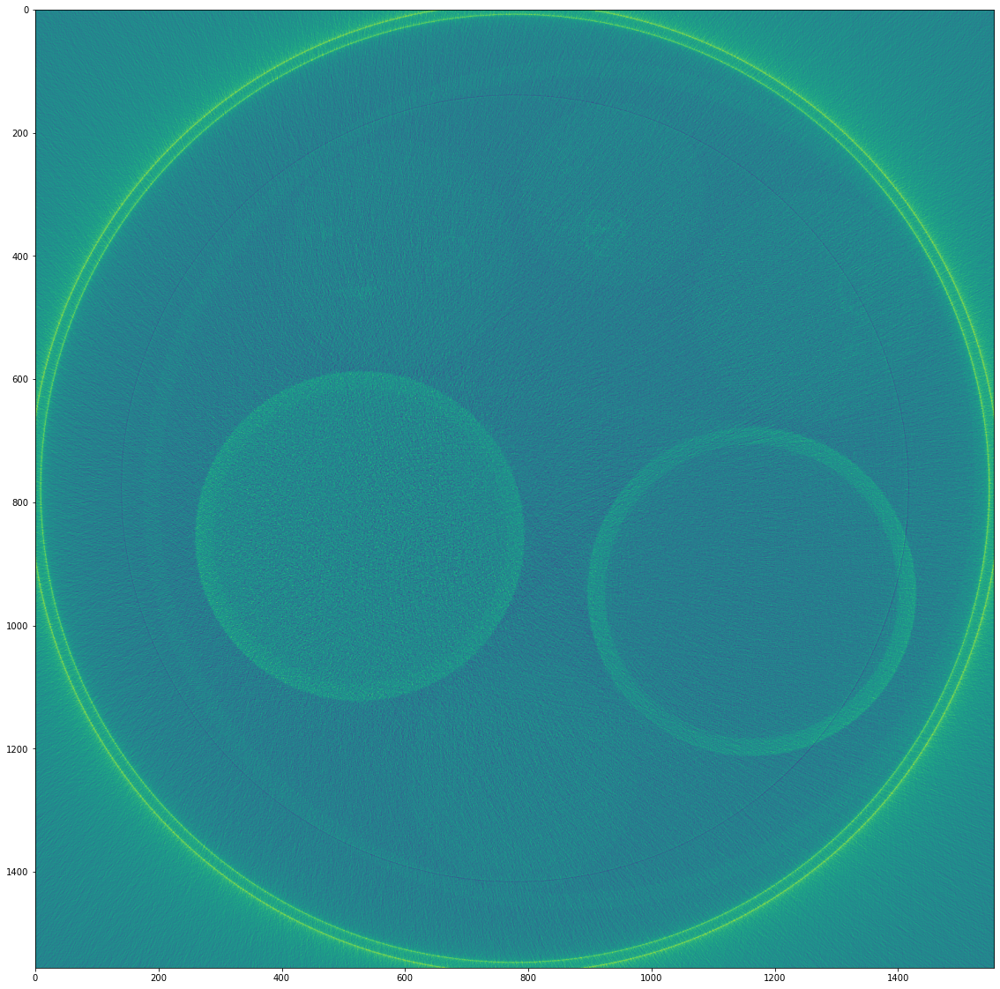

In [271]:
plt.figure(figsize=(20, 20))
plt.imshow(reco_before)

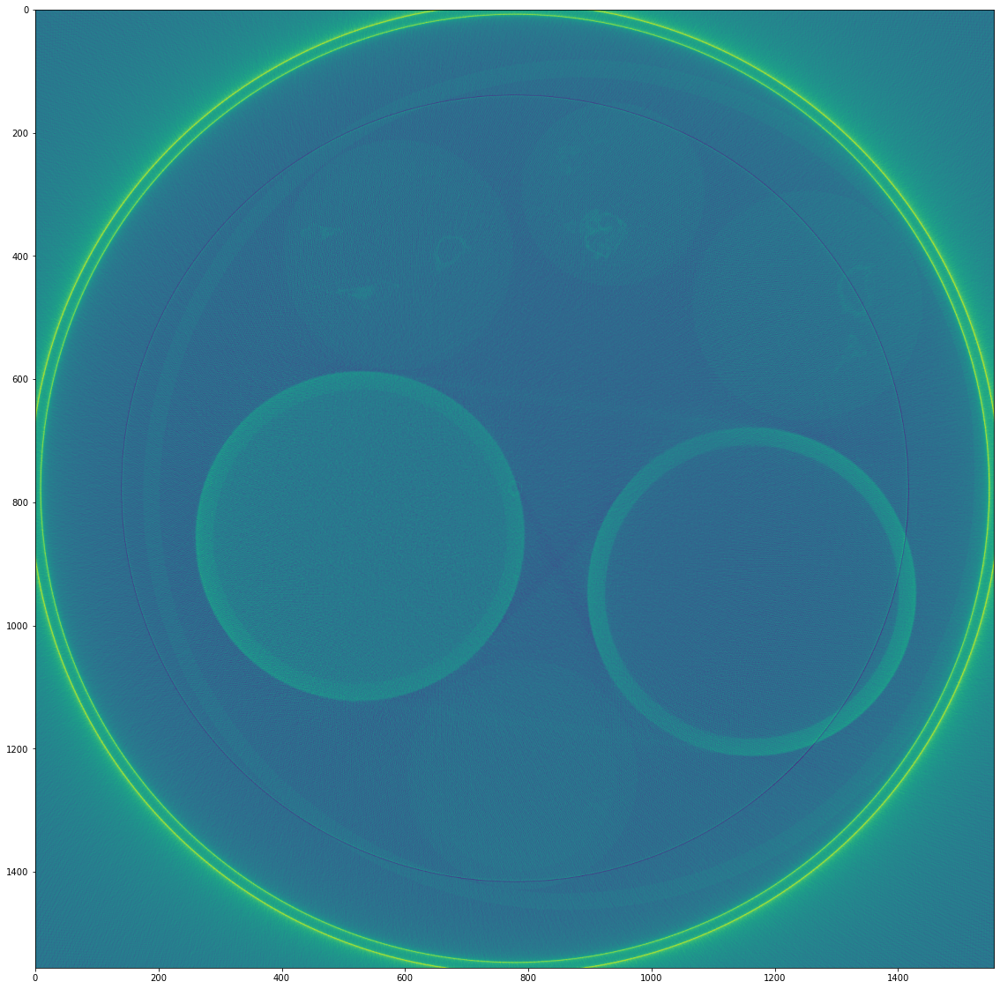

In [272]:
plt.figure(figsize=(20, 20))
plt.imshow(reco_gt)

In [273]:
peak_signal_noise_ratio(reco_gt, reco_before)

53.776468977071225

In [274]:
peak_signal_noise_ratio(reco_gt, reco_after)

59.5572139366159